In [219]:
import numpy as np
import pandas as pd
import csv            #importing this
from scipy import stats

from sklearn.decomposition import PCA

# Visualisation libraries
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots

DataFrame with the values imported as type int16 bytes to reduce the size

In [29]:
df = pd.read_csv('../Dataset/covtype_compressed.csv', dtype = 'int16', header = None)  #5523 is the highest value so 16 bytes is enough to represent it
df

,0,1,2,3,4,5,6,7,8,9,...,45,46,47,48,49,50,51,52,53,54
0,2596,51,3,258,0,510,221,232,148,6279,...,0,0,0,0,0,0,0,0,0,5
1,2590,56,2,212,-6,390,220,235,151,6225,...,0,0,0,0,0,0,0,0,0,5
2,2804,139,9,268,65,3180,234,238,135,6121,...,0,0,0,0,0,0,0,0,0,2
3,2785,155,18,242,118,3090,238,238,122,6211,...,0,0,0,0,0,0,0,0,0,2
4,2595,45,2,153,-1,391,220,234,150,6172,...,0,0,0,0,0,0,0,0,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5994,2425,0,11,503,81,853,204,220,153,1348,...,0,0,0,0,0,0,0,0,0,6
5995,2373,130,27,350,79,418,252,213,69,997,...,0,0,0,0,0,0,0,0,0,3
5996,2361,129,28,323,67,390,252,210,64,977,...,0,0,0,0,0,0,0,0,0,3
5997,3376,16,4,218,-1,4357,216,231,152,3952,...,0,0,0,0,0,0,0,0,1,7


Creating a list to assign dataframe columns with proper names

![Dataset details](../Dataset/data_details.png)

In [115]:
#Column names of the first 14 columns
column_names = ['elevation', 'aspect', 'slope',
                'horizontal_distance_to_hydrology',
                'vertical_distance_to_hydrology',
                'horizontal_distance_to_roadways',
                'hillshade_9am', 'hillshade_noon', 'hillshade_3pm',
                'horizontal_distance_to_fire_points', 'wilderness_area1',
                'wilderness_area2', 'wilderness_area3','wilderness_area4']

# adding the 40 soil types column names
for i in range(1,41):
    column_names.append(f"soil_type{i}")
    
# adding the final target columns 
column_names.append("cover_type")

print(column_names)

['elevation', 'aspect', 'slope', 'horizontal_distance_to_hydrology', 'vertical_distance_to_hydrology', 'horizontal_distance_to_roadways', 'hillshade_9am', 'hillshade_noon', 'hillshade_3pm', 'horizontal_distance_to_fire_points', 'wilderness_area1', 'wilderness_area2', 'wilderness_area3', 'wilderness_area4', 'soil_type1', 'soil_type2', 'soil_type3', 'soil_type4', 'soil_type5', 'soil_type6', 'soil_type7', 'soil_type8', 'soil_type9', 'soil_type10', 'soil_type11', 'soil_type12', 'soil_type13', 'soil_type14', 'soil_type15', 'soil_type16', 'soil_type17', 'soil_type18', 'soil_type19', 'soil_type20', 'soil_type21', 'soil_type22', 'soil_type23', 'soil_type24', 'soil_type25', 'soil_type26', 'soil_type27', 'soil_type28', 'soil_type29', 'soil_type30', 'soil_type31', 'soil_type32', 'soil_type33', 'soil_type34', 'soil_type35', 'soil_type36', 'soil_type37', 'soil_type38', 'soil_type39', 'soil_type40', 'cover_type']


In [126]:
df.columns = column_names     # replacing automatically generated numeric column names with proper column names
df

,elevation,aspect,slope,horizontal_distance_to_hydrology,vertical_distance_to_hydrology,horizontal_distance_to_roadways,hillshade_9am,hillshade_noon,hillshade_3pm,horizontal_distance_to_fire_points,...,soil_type32,soil_type33,soil_type34,soil_type35,soil_type36,soil_type37,soil_type38,soil_type39,soil_type40,cover_type
0,0.075658,-0.958388,-1.592424,0.493662,-0.838716,-0.748885,0.275718,0.682548,0.328162,3.818044,...,0,0,0,0,0,0,0,0,0,5
1,0.059767,-0.913565,-1.701069,0.202807,-0.945763,-0.829653,0.246293,0.805444,0.387445,3.775148,...,0,0,0,0,0,0,0,0,0,5
2,0.626549,-0.169500,-0.940553,0.556892,0.320964,1.048200,0.658242,0.928339,0.071273,3.692533,...,0,0,0,0,0,0,0,0,0,2
3,0.576227,-0.026066,0.037253,0.392495,1.266549,0.987624,0.775941,0.928339,-0.185617,3.764026,...,0,0,0,0,0,0,0,0,0,2
4,0.073010,-1.012176,-1.701069,-0.170246,-0.856557,-0.828980,0.246293,0.764478,0.367684,3.733046,...,0,0,0,0,0,0,0,0,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5994,-0.377238,-1.415585,-0.723263,2.042782,0.606423,-0.518024,-0.224505,0.190964,0.426966,-0.099006,...,0,0,0,0,0,0,0,0,0,6
5995,-0.514960,-0.250182,1.015060,1.075373,0.570741,-0.810807,1.187890,-0.095793,-1.232938,-0.377831,...,0,0,0,0,0,0,0,0,0,3
5996,-0.546742,-0.259147,1.123705,0.904653,0.356646,-0.829653,1.187890,-0.218689,-1.331742,-0.393718,...,0,0,0,0,0,0,0,0,0,3
5997,2.141498,-1.272151,-1.483778,0.240745,-0.856557,1.840398,0.128594,0.641582,0.407206,1.969539,...,0,0,0,0,0,0,0,0,1,7


In [127]:
original_length = len(df)
original_length

5999

In [128]:
df.describe()

,elevation,aspect,slope,horizontal_distance_to_hydrology,vertical_distance_to_hydrology,horizontal_distance_to_roadways,hillshade_9am,hillshade_noon,hillshade_3pm,horizontal_distance_to_fire_points,...,soil_type32,soil_type33,soil_type34,soil_type35,soil_type36,soil_type37,soil_type38,soil_type39,soil_type40,cover_type
count,5.999000e+03,5.999000e+03,5.999000e+03,5.999000e+03,5.999000e+03,5.999000e+03,5.999000e+03,5.999000e+03,5.999000e+03,5999.000000,...,5999.000000,5999.000000,5999.000000,5999.0,5999.0,5999.0,5999.000000,5999.000000,5999.000000,5999.000000
mean,5.306270e-16,-6.632838e-17,1.137058e-16,-3.790193e-17,-9.475482e-18,7.580386e-17,-1.587143e-16,2.676824e-16,1.563455e-16,0.000000,...,0.017670,0.020170,0.000500,0.0,0.0,0.0,0.015003,0.014669,0.004167,3.795299
std,1.000083e+00,1.000083e+00,1.000083e+00,1.000083e+00,1.000083e+00,1.000083e+00,1.000083e+00,1.000083e+00,1.000083e+00,1.000083,...,0.131758,0.140593,0.022359,0.0,0.0,0.0,0.121573,0.120235,0.064426,1.641748
min,-1.865702e+00,-1.415585e+00,-1.918359e+00,-1.137656e+00,-3.229441e+00,-1.071957e+00,-6.227185e+00,-4.765836e+00,-2.596431e+00,-1.145989,...,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,1.000000
25%,-8.513214e-01,-8.149541e-01,-8.319077e-01,-8.720923e-01,-7.851924e-01,-6.761940e-01,-5.481791e-01,-5.464110e-01,-6.796367e-01,-0.678898,...,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,2.000000
50%,-2.871882e-01,-3.308637e-01,-7.139175e-02,-1.892149e-01,-3.391618e-01,-3.362958e-01,2.757180e-01,1.909642e-01,7.127250e-02,-0.292833,...,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,4.000000
75%,8.371056e-01,1.040726e+00,6.891242e-01,6.137983e-01,4.993759e-01,2.092238e-01,7.465164e-01,7.235130e-01,7.233779e-01,0.306521,...,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,5.000000
max,2.316300e+00,1.811685e+00,3.731188e+00,5.166314e+00,9.045324e+00,3.545274e+00,1.246740e+00,1.583784e+00,2.304239e+00,4.274013,...,1.000000,1.000000,1.000000,0.0,0.0,0.0,1.000000,1.000000,1.000000,7.000000


In [129]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5999 entries, 0 to 5998
Data columns (total 55 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   elevation                           5999 non-null   float64
 1   aspect                              5999 non-null   float64
 2   slope                               5999 non-null   float64
 3   horizontal_distance_to_hydrology    5999 non-null   float64
 4   vertical_distance_to_hydrology      5999 non-null   float64
 5   horizontal_distance_to_roadways     5999 non-null   float64
 6   hillshade_9am                       5999 non-null   float64
 7   hillshade_noon                      5999 non-null   float64
 8   hillshade_3pm                       5999 non-null   float64
 9   horizontal_distance_to_fire_points  5999 non-null   float64
 10  wilderness_area1                    5999 non-null   int16  
 11  wilderness_area2                    5999 no

In [130]:
# To get a feel of the data a line chart is plotted
fig = px.line(df, x=df.index, y= df.columns, title='                     Covertype column values vs samples')
fig.show()

# 1. Preprocessing

### Dropping all rows with missing values

In [131]:
df = df.dropna()
len_after_na_drop = len(df)
print(f"The number of raws with missing values that have been dropped is {len_after_na_drop-original_length}")  # there should be none as the dataset obtained mentions that it has none

The number of raws with missing values that have been dropped is 0


Eventhough all the columns are numeric, some of them are categorical and need not be normalised. This is provided by the by the dataset description.

=> Extracting the quantitative columns, that have continuously values.

In [154]:
# Extracting the quantiative columns, which are the first 10 columns
quantitative_columns = column_names[:10]   # the names of the columns are the numbers ranging from 0 to 54 in this project
print("The quantiative/continous columns are: ", quantitative_columns,'\n\nThe dataframe created from those columns is:')

# Creating a dataframe of the quantiative columns only 
quantitative_columns_df = df[quantitative_columns]
quantitative_columns_df

The quantiative/continous columns are:  ['elevation', 'aspect', 'slope', 'horizontal_distance_to_hydrology', 'vertical_distance_to_hydrology', 'horizontal_distance_to_roadways', 'hillshade_9am', 'hillshade_noon', 'hillshade_3pm', 'horizontal_distance_to_fire_points'] 

The dataframe created from those columns is:


,elevation,aspect,slope,horizontal_distance_to_hydrology,vertical_distance_to_hydrology,horizontal_distance_to_roadways,hillshade_9am,hillshade_noon,hillshade_3pm,horizontal_distance_to_fire_points
0,0.075658,-0.958388,-1.592424,0.493662,-0.838716,-0.748885,0.275718,0.682548,0.328162,3.818044
1,0.059767,-0.913565,-1.701069,0.202807,-0.945763,-0.829653,0.246293,0.805444,0.387445,3.775148
2,0.626549,-0.169500,-0.940553,0.556892,0.320964,1.048200,0.658242,0.928339,0.071273,3.692533
3,0.576227,-0.026066,0.037253,0.392495,1.266549,0.987624,0.775941,0.928339,-0.185617,3.764026
4,0.073010,-1.012176,-1.701069,-0.170246,-0.856557,-0.828980,0.246293,0.764478,0.367684,3.733046
...,...,...,...,...,...,...,...,...,...,...
5994,-0.377238,-1.415585,-0.723263,2.042782,0.606423,-0.518024,-0.224505,0.190964,0.426966,-0.099006
5995,-0.514960,-0.250182,1.015060,1.075373,0.570741,-0.810807,1.187890,-0.095793,-1.232938,-0.377831
5996,-0.546742,-0.259147,1.123705,0.904653,0.356646,-0.829653,1.187890,-0.218689,-1.331742,-0.393718
5997,2.141498,-1.272151,-1.483778,0.240745,-0.856557,1.840398,0.128594,0.641582,0.407206,1.969539


=> Extracting the categorical columns.

In [155]:
# Extracting the categorical columns, which are the columns from index 10 - 54 of the column names list
categorical_columns = column_names[10:54]
print("The Categorical columns are: ", categorical_columns,'\n\nThe dataframe created from those columns is:')

# Creating a dataframe of the categorical columns only 
categorical_columns_df = df[categorical_columns]   # creating a categorical dataframe
categorical_columns_df

The Categorical columns are:  ['wilderness_area1', 'wilderness_area2', 'wilderness_area3', 'wilderness_area4', 'soil_type1', 'soil_type2', 'soil_type3', 'soil_type4', 'soil_type5', 'soil_type6', 'soil_type7', 'soil_type8', 'soil_type9', 'soil_type10', 'soil_type11', 'soil_type12', 'soil_type13', 'soil_type14', 'soil_type15', 'soil_type16', 'soil_type17', 'soil_type18', 'soil_type19', 'soil_type20', 'soil_type21', 'soil_type22', 'soil_type23', 'soil_type24', 'soil_type25', 'soil_type26', 'soil_type27', 'soil_type28', 'soil_type29', 'soil_type30', 'soil_type31', 'soil_type32', 'soil_type33', 'soil_type34', 'soil_type35', 'soil_type36', 'soil_type37', 'soil_type38', 'soil_type39', 'soil_type40'] 

The dataframe created from those columns is:


,wilderness_area1,wilderness_area2,wilderness_area3,wilderness_area4,soil_type1,soil_type2,soil_type3,soil_type4,soil_type5,soil_type6,...,soil_type31,soil_type32,soil_type33,soil_type34,soil_type35,soil_type36,soil_type37,soil_type38,soil_type39,soil_type40
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5994,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5995,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5996,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5997,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


Once the quantiative columns have been extracted, we can normalise the dataframe of the quantiative columns. It would meaning meaningless to normalise the categorical columns.

In [156]:
# Normalizing the quantitative columns and storing them in a new dataframe, quantitative_normalised_columns_df
quantitative_normalised_columns_df = stats.zscore(quantitative_columns_df)

# Updating the original dataframe with the normalised quantiative columns
for i in quantitative_columns:
    df[i] = quantitative_normalised_columns_df[i]

In [161]:
# Making a copy of the original dataframe to preserve the data as a reference

new_df = df.copy()     # a copy of the original dataframe 
new_df

,elevation,aspect,slope,horizontal_distance_to_hydrology,vertical_distance_to_hydrology,horizontal_distance_to_roadways,hillshade_9am,hillshade_noon,hillshade_3pm,horizontal_distance_to_fire_points,...,soil_type32,soil_type33,soil_type34,soil_type35,soil_type36,soil_type37,soil_type38,soil_type39,soil_type40,cover_type
0,0.075658,-0.958388,-1.592424,0.493662,-0.838716,-0.748885,0.275718,0.682548,0.328162,3.818044,...,0,0,0,0,0,0,0,0,0,5
1,0.059767,-0.913565,-1.701069,0.202807,-0.945763,-0.829653,0.246293,0.805444,0.387445,3.775148,...,0,0,0,0,0,0,0,0,0,5
2,0.626549,-0.169500,-0.940553,0.556892,0.320964,1.048200,0.658242,0.928339,0.071273,3.692533,...,0,0,0,0,0,0,0,0,0,2
3,0.576227,-0.026066,0.037253,0.392495,1.266549,0.987624,0.775941,0.928339,-0.185617,3.764026,...,0,0,0,0,0,0,0,0,0,2
4,0.073010,-1.012176,-1.701069,-0.170246,-0.856557,-0.828980,0.246293,0.764478,0.367684,3.733046,...,0,0,0,0,0,0,0,0,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5994,-0.377238,-1.415585,-0.723263,2.042782,0.606423,-0.518024,-0.224505,0.190964,0.426966,-0.099006,...,0,0,0,0,0,0,0,0,0,6
5995,-0.514960,-0.250182,1.015060,1.075373,0.570741,-0.810807,1.187890,-0.095793,-1.232938,-0.377831,...,0,0,0,0,0,0,0,0,0,3
5996,-0.546742,-0.259147,1.123705,0.904653,0.356646,-0.829653,1.187890,-0.218689,-1.331742,-0.393718,...,0,0,0,0,0,0,0,0,0,3
5997,2.141498,-1.272151,-1.483778,0.240745,-0.856557,1.840398,0.128594,0.641582,0.407206,1.969539,...,0,0,0,0,0,0,0,0,1,7


### Checking for outliers

Checking for outliers only on the quantitative / continues columns only using the BOX-WHISKER PLOT

In [174]:
np.arange(2,12)
quantitative_columns

['elevation',
 'aspect',
 'slope',
 'horizontal_distance_to_hydrology',
 'vertical_distance_to_hydrology',
 'horizontal_distance_to_roadways',
 'hillshade_9am',
 'hillshade_noon',
 'hillshade_3pm',
 'horizontal_distance_to_fire_points']

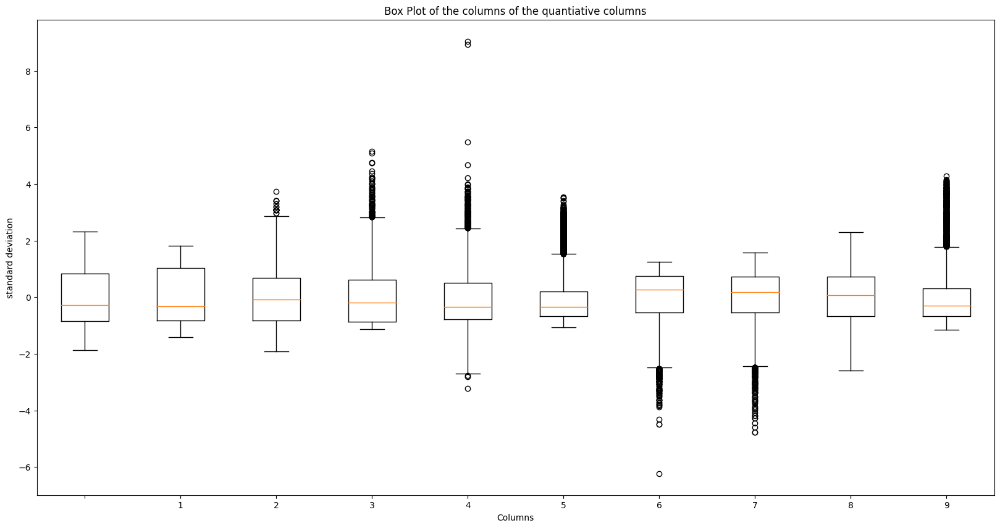

In [176]:
fig, axs = plt.subplots()
fig.set_size_inches(20,10)
plt.xticks(np.arange(2,12), quantitative_columns)
plt.xlabel("Columns")
plt.ylabel("standard deviation")
plt.title("Box Plot of the columns of the quantiative columns")
_=plt.boxplot(quantitative_normalised_columns_df, vert = True)

In [177]:
quantitative_normalised_columns_df

,elevation,aspect,slope,horizontal_distance_to_hydrology,vertical_distance_to_hydrology,horizontal_distance_to_roadways,hillshade_9am,hillshade_noon,hillshade_3pm,horizontal_distance_to_fire_points
0,0.075658,-0.958388,-1.592424,0.493662,-0.838716,-0.748885,0.275718,0.682548,0.328162,3.818044
1,0.059767,-0.913565,-1.701069,0.202807,-0.945763,-0.829653,0.246293,0.805444,0.387445,3.775148
2,0.626549,-0.169500,-0.940553,0.556892,0.320964,1.048200,0.658242,0.928339,0.071273,3.692533
3,0.576227,-0.026066,0.037253,0.392495,1.266549,0.987624,0.775941,0.928339,-0.185617,3.764026
4,0.073010,-1.012176,-1.701069,-0.170246,-0.856557,-0.828980,0.246293,0.764478,0.367684,3.733046
...,...,...,...,...,...,...,...,...,...,...
5994,-0.377238,-1.415585,-0.723263,2.042782,0.606423,-0.518024,-0.224505,0.190964,0.426966,-0.099006
5995,-0.514960,-0.250182,1.015060,1.075373,0.570741,-0.810807,1.187890,-0.095793,-1.232938,-0.377831
5996,-0.546742,-0.259147,1.123705,0.904653,0.356646,-0.829653,1.187890,-0.218689,-1.331742,-0.393718
5997,2.141498,-1.272151,-1.483778,0.240745,-0.856557,1.840398,0.128594,0.641582,0.407206,1.969539


From the box-whisker plot above it is clear that there are outliers in the data

In [178]:
def IQR_outlier_handler(series_input):
    """ A function to return the indices of rows that contain outlier values of the series_input

    Args:
        series_input: a quantitative column that has continuous values
        
    Returns: 
        a list of indices of values in series that are outliers
    """
    Q1 = series_input.quantile(0.25)
    Q3 = series_input.quantile(0.75)
    
    IQR = Q3 - Q1                      #IQR is interquartile range. 
    
    lower_bound = Q1-1.1*IQR        # the common factor multiplied by IQR is 1.5 but we can contraol the values of k based on the standard deviation to not be tolerated
    higher_bound = Q3 + 1.1*IQR
    
    outlier_indices = list()  # a list to store indices of outlier values
    
    # a for loop to iterate over all values of a column and check for outlier values
    for k in range(len(series_input)):
        if ((series_input[k]> higher_bound) or (series_input[k]< lower_bound)):   # checking if a value is an outlier
            outlier_indices.append(k)
            
    return  outlier_indices  

# Alternative code to find the indices of the rows that need to be dropped instead of IQR but directly by finding rows that exceed certain threshold

# outlier_detector = (quantitative_normalised_columns_df>1.5) | (quantitative_normalised_columns_df<-1.5)
# list_backup = list()
# for i in range(len(outlier_detector)):
#     if True in outlier_detector.iloc[i].values:
#         list_backup.append(i)
        
# len(list_backup)
# outlier_detector

In [179]:
df_outlier_indices = list()  # a list to store the unique index number of all rows in the dataframe that contain outlier values, that are to be dropped later

# Iterating over every column and identifying the rows/ indices that contain outlier values
for i in quantitative_columns:
    series_instance = quantitative_normalised_columns_df[i]   # a series selected
    outlier_indexes = IQR_outlier_handler(series_instance)    # applying 
    for ind in outlier_indexes:
        if ind not in df_outlier_indices:
            df_outlier_indices.append(ind)
print(f"According to the BOX-WHISKER plot and IQR detection the number of rows with outlier values is: {len(df_outlier_indices)}\n")
print(f"The outlier indices are: {df_outlier_indices}")

According to the BOX-WHISKER plot and IQR detection the number of rows with outlier values is: 2022

The outlier indices are: [884, 1411, 1416, 1419, 1423, 1427, 1431, 1439, 1444, 1449, 1454, 1458, 1459, 1461, 1469, 1517, 2053, 2224, 2241, 2502, 2696, 2701, 2721, 2722, 2790, 2791, 2988, 3003, 3030, 3035, 3056, 3104, 3159, 3160, 3194, 3195, 3204, 3205, 3253, 3254, 3270, 3372, 3427, 3428, 3429, 3565, 3604, 4226, 4286, 4287, 4638, 4929, 87, 97, 126, 137, 140, 180, 182, 185, 193, 197, 201, 206, 210, 215, 217, 221, 226, 228, 236, 237, 243, 247, 248, 255, 256, 257, 258, 260, 266, 270, 279, 284, 287, 292, 293, 298, 304, 308, 311, 322, 328, 332, 353, 354, 358, 365, 374, 375, 477, 480, 486, 499, 505, 520, 525, 534, 539, 541, 546, 569, 570, 664, 669, 680, 704, 708, 713, 720, 721, 723, 830, 853, 863, 867, 885, 906, 923, 954, 962, 967, 973, 1013, 1022, 1038, 1046, 1055, 1065, 1083, 1093, 1094, 1108, 1112, 1133, 1139, 1201, 1213, 1218, 1305, 1321, 1330, 1457, 1467, 1473, 1569, 1791, 1803, 1816, 182

In [180]:
new_df.drop(index=df_outlier_indices, inplace = True)
quantitative_normalised_columns_df.drop(index=df_outlier_indices, inplace = True)   #updating the quantiatitve_normalised_columns_df as well

len_after_outlier_drop = len(new_df)
print(f"--> {len_after_na_drop-len_after_outlier_drop} rows with outliers dropped have been dropped after BOX-WHISKER plot and IQR ")

--> 2022 rows with outliers dropped have been dropped after BOX-WHISKER plot and IQR 


In [181]:
new_df

,elevation,aspect,slope,horizontal_distance_to_hydrology,vertical_distance_to_hydrology,horizontal_distance_to_roadways,hillshade_9am,hillshade_noon,hillshade_3pm,horizontal_distance_to_fire_points,...,soil_type32,soil_type33,soil_type34,soil_type35,soil_type36,soil_type37,soil_type38,soil_type39,soil_type40,cover_type
220,-0.075307,-1.209398,-0.071392,-0.568591,-0.571098,-0.763693,-0.136231,-0.587376,-0.126335,1.304650,...,0,0,0,0,0,0,0,0,0,2
235,0.102143,1.775826,0.037253,-0.714019,-0.374844,-0.478986,-0.695304,-0.423515,0.407206,1.351518,...,0,0,0,0,0,0,0,0,0,2
238,0.128628,1.802720,0.689124,-0.872092,-0.571098,-0.434563,-1.048402,-1.160890,0.209598,1.361050,...,0,0,0,0,0,0,0,0,0,2
241,-0.099144,-0.079854,-1.809714,0.879362,0.071186,-0.934651,0.275718,0.928339,0.446727,0.995639,...,0,0,0,0,0,0,0,0,0,2
259,0.012094,-0.976318,0.254544,1.290353,0.106869,-0.828980,0.363993,-0.956064,-0.738919,0.823260,...,0,0,0,0,0,0,0,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5992,-0.258055,0.287696,-1.049198,0.379850,-0.196432,-0.666098,0.246293,1.297027,0.565292,-0.091857,...,0,0,0,0,0,0,0,0,0,6
5993,-0.530851,1.775826,-1.157843,-1.137656,-0.838716,-0.613599,-0.077381,0.477721,0.506009,0.051130,...,0,0,0,0,0,0,0,0,0,4
5994,-0.377238,-1.415585,-0.723263,2.042782,0.606423,-0.518024,-0.224505,0.190964,0.426966,-0.099006,...,0,0,0,0,0,0,0,0,0,6
5995,-0.514960,-0.250182,1.015060,1.075373,0.570741,-0.810807,1.187890,-0.095793,-1.232938,-0.377831,...,0,0,0,0,0,0,0,0,0,3


# 2. Exploratory Data Analysis

## Extensive Visualisation

- Visualisation of the quantitative columns.
- visualisation of the categorical columns.
- visualisation of the classes.

### 2.1 Class Labels

In [197]:
class_labels = np.unique(new_df['cover_type'].values)
class_labels

array([1, 2, 3, 4, 5, 6, 7], dtype=int16)

In [185]:
class_label1 = new_df.loc[new_df['cover_type']==1] 
len_class_label1 = len(class_label1)
print(f"number of class label 1 is: {len_class_label1}")

class_label2 = new_df.loc[new_df['cover_type']==2]
len_class_label2 = len(class_label2)
print(f"number of class label 2 is: {len_class_label2}")

class_label3 = new_df.loc[new_df['cover_type']==3] 
len_class_label3 = len(class_label3)
print(f"number of class label 3 is: {len_class_label3}")

class_label4 = new_df.loc[new_df['cover_type']==4] 
len_class_label4 = len(class_label4)
print(f"number of class label 4 is: {len_class_label4}")

class_label5 = new_df.loc[new_df['cover_type']==5] 
len_class_label5 = len(class_label5)
print(f"number of class label 5 is: {len_class_label5}")

class_label6 = new_df.loc[new_df['cover_type']==6] 
len_class_label6 = len(class_label6)
print(f"number of class label 6 is: {len_class_label6}")

class_label7 = new_df.loc[new_df['cover_type']==7] 
len_class_label7 = len(class_label7)
print(f"number of class label 7 is: {len_class_label7}")

number of class label 1 is: 143
number of class label 2 is: 455
number of class label 3 is: 525
number of class label 4 is: 1376
number of class label 5 is: 761
number of class label 6 is: 601
number of class label 7 is: 116


In [187]:
fig = px.bar(x=np.arange(1,8), y=np.array([len_class_label1,len_class_label2,len_class_label3,len_class_label4,len_class_label5,len_class_label6,len_class_label7]), text_auto='.2s', title="Plot of frequency of each class label ")
fig.show()

### 2.2 Feature columns

#### 2.2.1 Visualizing the categorical columns separately due to their different meaning and values than the quantitative values

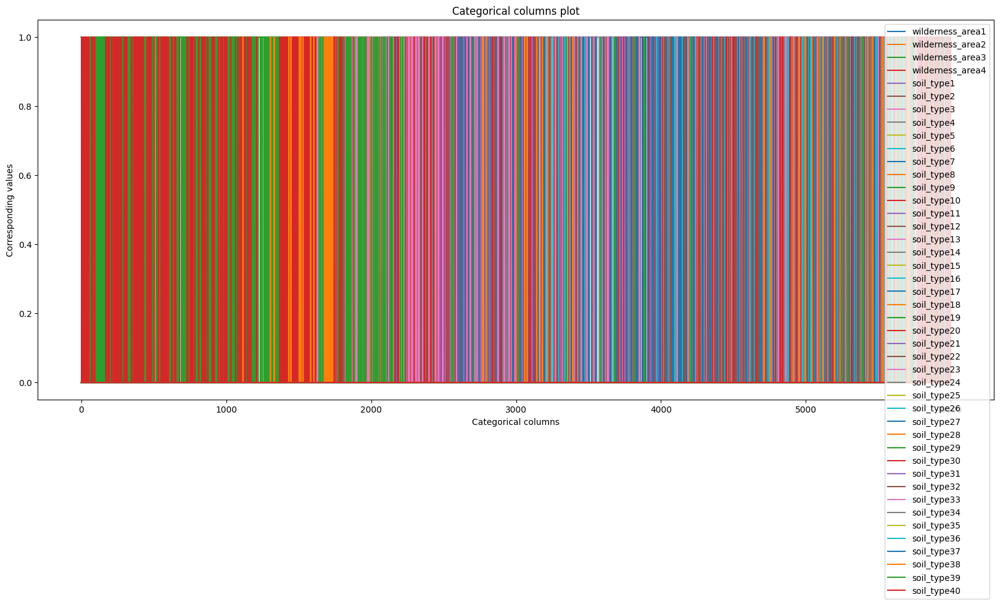

In [188]:
fig, ax = plt.subplots()
fig.set_size_inches(20, 8)
_=plt.plot(categorical_columns_df, label = categorical_columns_df.columns)
_=plt.title("Categorical columns plot")
_=plt.xlabel("Categorical columns")
_=plt.ylabel("Corresponding values")
_=plt.legend()

- In the plot, the 44 categorical columns have only two values each, 0 (absence) and 1 (presence) of a feature, and that's why the lines line chart shows vertical lines transitioning between values 0 and 1.

- Some of the columns might have the same constant value throught the whole dataset.

- If such column/feature exists, then it will be dropped as it is meaningless in predicing the output if it is the same value throughout.

- Thus, categorical values need to be checked for such behavior. 

In [189]:
def constant_value_checker(series_to_be_checked):
    """A function that takes a series/column as an input and checks if it is a constant value througought all samples, to be used for categorical columns.

    Args:
        series (_type_): takes column values to be checked

    Returns:
        boolean _type_: returns True if it is a horizontal line, with constant value across all samples; it returns false otherwise. 
    """
    is_flat = False
    if len(np.unique(series_to_be_checked))==1:   # if it has one value either 0 or 1 throught the whole dataset, then return true
        is_flat = True
        
    return is_flat

In [190]:
columns_to_be_dropped = list()   # a list to store columns,meaningless, with constant values throughout all the samples

# a for loop to iterate over all the categorical columns one by one
for col in categorical_columns_df:
    
    is_it_flat = constant_value_checker(categorical_columns_df[col].values)  # calling the function constant_value_checker to check if all the values of a series are the same
    if is_it_flat:      # if so, then to be dropped later, we append the column name into the columns_to_be_dropped list
        columns_to_be_dropped.append(col)

print(f"There are {len(columns_to_be_dropped)} columns that have one value throught all the samples.\nThe colulmns names are: {columns_to_be_dropped}")

There are 10 columns that have one value throught all the samples.
The colulmns names are: ['wilderness_area2', 'soil_type7', 'soil_type15', 'soil_type21', 'soil_type25', 'soil_type26', 'soil_type27', 'soil_type35', 'soil_type36', 'soil_type37']


In [191]:
# Dropping the categorical columns that have unchanging value from the new_df and the categorical_columns_df

new_df = new_df.drop( columns = columns_to_be_dropped, inplace = True )
categorical_columns_df = categorical_columns_df.drop( columns = columns_to_be_dropped, inplace = True )

C:\Users\hoany\AppData\Local\Temp\ipykernel_29224\1108429090.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### 2.2.2 Visualising quantiative columns, the first 10 columns

Text(0.5, 1.0, '7')

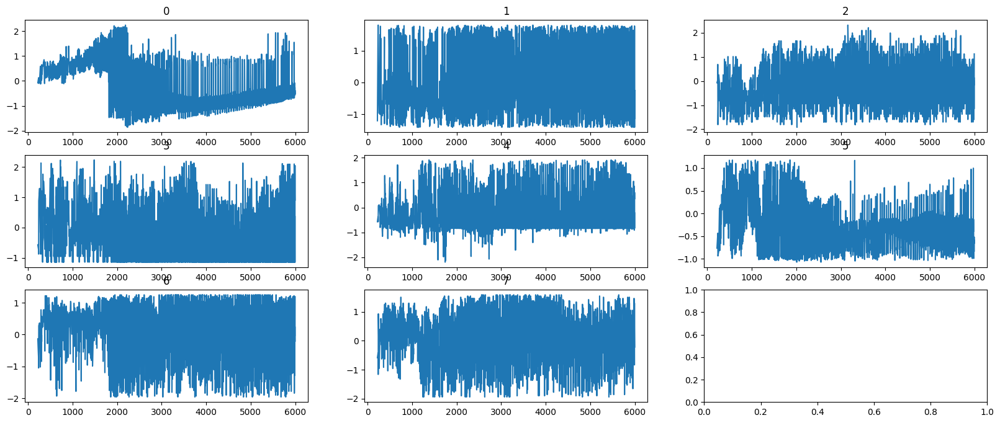

In [196]:
# first row
fig, axes = plt.subplots(3,3)
fig.set_size_inches(20,8)
axes[0, 0].plot(new_df.index, new_df[column_names[0]])
axes[0, 0].set_title("0") 
axes[0, 1].plot(new_df.index, new_df[column_names[1]])
axes[0, 1].set_title("1") 
axes[0, 2].plot(new_df.index, new_df[column_names[2]])
axes[0, 2].set_title("2") 
# second row
axes[1, 0].plot(new_df.index, new_df[column_names[3]])
axes[1, 0].set_title("3")
axes[1, 1].plot(new_df.index, new_df[column_names[4]])
axes[1, 1].set_title("4")
axes[1, 2].plot(new_df.index, new_df[column_names[5]])
axes[1, 2].set_title("5")
# third row
axes[2, 0].plot(new_df.index, new_df[column_names[6]])
axes[2, 0].set_title("6")
axes[2, 1].plot(new_df.index, new_df[column_names[7]])
axes[2, 1].set_title("7")


Text(0.5, 1.0, '7')

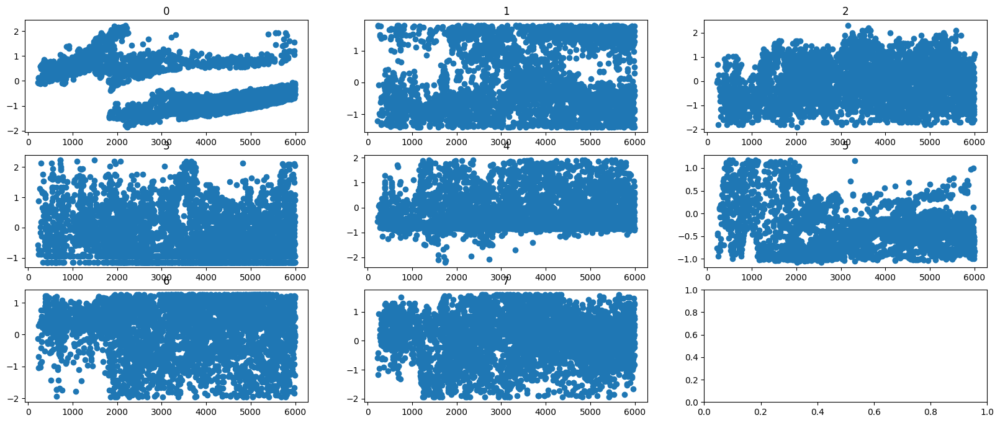

In [195]:
# first row
fig, axes = plt.subplots(3,3)
fig.set_size_inches(20,8)
axes[0, 0].scatter(new_df.index, new_df[column_names[0]])
axes[0, 0].set_title("0") 
axes[0, 1].scatter(new_df.index, new_df[column_names[1]])
axes[0, 1].set_title("1") 
axes[0, 2].scatter(new_df.index, new_df[column_names[2]])
axes[0, 2].set_title("2") 
# second row
axes[1, 0].scatter(new_df.index, new_df[column_names[3]])
axes[1, 0].set_title("3")
axes[1, 1].scatter(new_df.index, new_df[column_names[4]])
axes[1, 1].set_title("4")
axes[1, 2].scatter(new_df.index, new_df[column_names[5]])
axes[1, 2].set_title("5")
# third row
axes[2, 0].scatter(new_df.index, new_df[column_names[6]])
axes[2, 0].set_title("6")
axes[2, 1].scatter(new_df.index, new_df[column_names[7]])
axes[2, 1].set_title("7")


##### 2.2.2.1 Correlation matrix of quantitative columns

- A strong correlation between two columns indicates that the two columns concerned provide similar information in the data, making one of them reduandant. 

- This could ,first , worsen the performance of our model by masking other patterns displayed in our data. Secondly, it adds unnecessary complexity to our model.

- Both strong positive annd strong negative correlations provide the same insight of redundancy among columns - just in different ways, where positive correlation indicates that the two columns increase simultaneously negative correlation indicates that one of the columns increases when the other decreases, or vice versa.

- Therefore, such columns will be identified and one column from the pair of columns with strong correlation will be dropped. 

- The threshold for strong correlation between two columns in this project will be set to 0.7.

In [245]:
correlated_new_df = quantitative_normalised_columns_df.corr()
correlated_new_df

,elevation,aspect,slope,horizontal_distance_to_hydrology,vertical_distance_to_hydrology,horizontal_distance_to_roadways,hillshade_9am,hillshade_noon,hillshade_3pm,horizontal_distance_to_fire_points
elevation,1.000000,-0.064167,-0.245355,0.254537,0.001995,0.489772,0.077456,0.142728,0.044924,0.602830
aspect,-0.064167,1.000000,-0.033732,-0.002318,0.001660,0.102821,-0.635619,0.358938,0.639647,-0.085839
slope,-0.245355,-0.033732,1.000000,0.133229,0.380439,-0.296411,0.075337,-0.584586,-0.468038,-0.145239
horizontal_distance_to_hydrology,0.254537,-0.002318,0.133229,1.000000,0.680917,0.005991,-0.004291,-0.035585,-0.031908,0.139340
vertical_distance_to_hydrology,0.001995,0.001660,0.380439,0.680917,1.000000,-0.147372,0.031177,-0.224743,-0.182056,-0.001199
horizontal_distance_to_roadways,0.489772,0.102821,-0.296411,0.005991,-0.147372,1.000000,-0.072594,0.327849,0.241420,0.339340
hillshade_9am,0.077456,-0.635619,0.075337,-0.004291,0.031177,-0.072594,1.000000,-0.174217,-0.851471,0.088653
hillshade_noon,0.142728,0.358938,-0.584586,-0.035585,-0.224743,0.327849,-0.174217,1.000000,0.645025,0.006105
hillshade_3pm,0.044924,0.639647,-0.468038,-0.031908,-0.182056,0.241420,-0.851471,0.645025,1.000000,-0.040470
horizontal_distance_to_fire_points,0.602830,-0.085839,-0.145239,0.139340,-0.001199,0.339340,0.088653,0.006105,-0.040470,1.000000


A heatmap of the correlation matrix using seaborn

<Axes: title={'center': 'Heatmap of the corerlation of the quantitative columns'}>

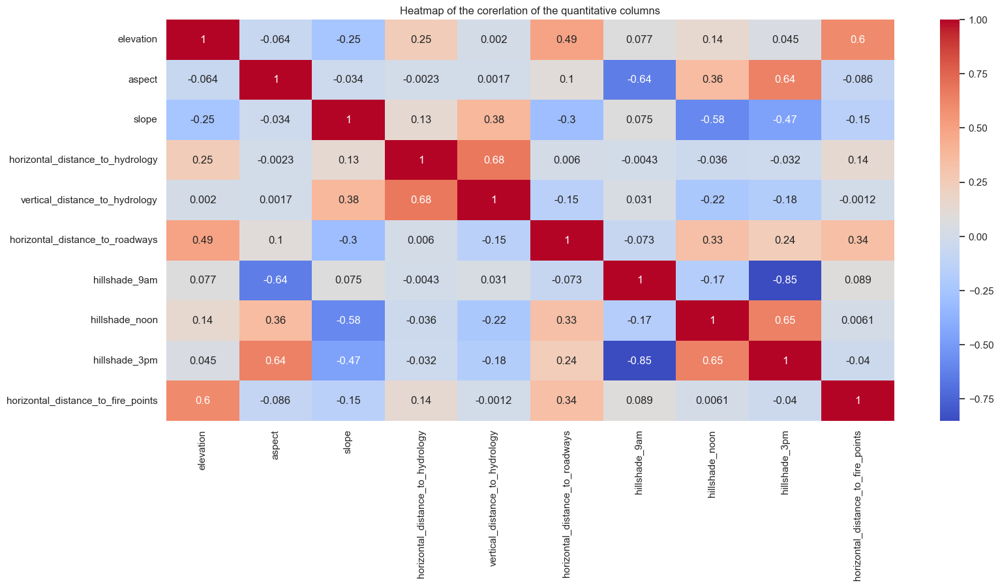

In [246]:
fig, ax = plt.subplots(figsize=(18, 8))                                          # using matplotlib's plt with seaborn to set to change the size of the correlation matrix
plt.title("Heatmap of the corerlation of the quantitative columns")              # again using matplotlib's plt to display the title of the heatmap plot
sns.heatmap(correlated_new_df.values,xticklabels = correlated_new_df.columns, yticklabels= correlated_new_df.columns, cmap = 'coolwarm',annot = True)  # viridis, Spectral

From the heatmap plot of the correlation matrix it is evidient that there are columns that display strong correlation. These columns shall be identified, and dropped. 

In [350]:
def strongly_correlated_columns_finder(correlated_df, strong_threshold):
    """A function that takes a dataframe that has column names as its indexes. Those rows, which are columns definitely have strong correlation. 
    The purpose of this function is to find the pairing column from the correlation matrix that results in strong correlation by iterating over all the columsn. 

    Args:
        correlated_df (_type_): _description_
        strong_threshold (_type_): a threshold value that determines if a pair of columns have strong correlation, effectively determining redundant columns.
        
    Returns:
        A list of tuples, column pairs, that have strong correlation. 
    """
    correlated_columns_tuple = list() 
    # for loop to iterate over the columns that have strong correlation, that are indexes in the correlated_df
    for j in correlated_df.index:  
        # for loop to iterate over all the columns of the original data, to identify those that have strong correlation with the selected column j   
        for k in correlated_df:
            correlation_value = correlated_df[k].loc[j]      # obtaining a correlation value
            
            # checking if value indicates strong corerelation by taking the absolute value of correlation value   
            if (abs(correlation_value)>strong_threshold and abs(correlation_value < 1)):
                # checking if the pair fo columns doesn't already exist in the list
                if ((k,j) not in correlated_columns_tuple):
                    correlated_columns_tuple.append((j,k))     # saving the corresponding columns that have a strong correlation
                    print(f"Strongly-correlated pair {(j,k)} ")    
                        
    return correlated_columns_tuple

In [351]:
strong_threshold = 0.68
strongly_correlated_metrices = list()

# extracting the strongly correlated columns: strong positive correlation and strong negative correlation
strong_corr_entries_df = correlated_new_df[(((correlated_new_df.values>strong_threshold) & (correlated_new_df.values!=1.00))| 
                                          ((correlated_new_df.values< -strong_threshold) & (correlated_new_df.values!=-1.00)))] 
"""
trong_corr_positive df extracts a dataframe with all columns of the correlation matrix but only the rows(which are also column names) that definitely have strong correlation 
values by utilising the strong_threshold to determine the rows with strong correlation values. 
This is computationally efficient, instead of checking for strong correlation across rows against all columns of the correlation matrix
we only check those rows that have strong correlation against all the columns to find their counteraprt columns that result in strong correlation 
"""
print(f"The content of the strong_corr_entries_df with entries that contain strong correlation values is: ")
display(strong_corr_entries_df)

The content of the strong_corr_entries_df with entries that contain strong correlation values is: 


,elevation,aspect,slope,horizontal_distance_to_hydrology,vertical_distance_to_hydrology,horizontal_distance_to_roadways,hillshade_9am,hillshade_noon,hillshade_3pm,horizontal_distance_to_fire_points
horizontal_distance_to_hydrology,0.254537,-0.002318,0.133229,1.000000,0.680917,0.005991,-0.004291,-0.035585,-0.031908,0.139340
vertical_distance_to_hydrology,0.001995,0.001660,0.380439,0.680917,1.000000,-0.147372,0.031177,-0.224743,-0.182056,-0.001199
hillshade_9am,0.077456,-0.635619,0.075337,-0.004291,0.031177,-0.072594,1.000000,-0.174217,-0.851471,0.088653
hillshade_3pm,0.044924,0.639647,-0.468038,-0.031908,-0.182056,0.241420,-0.851471,0.645025,1.000000,-0.040470


Identifying all the column pairs that result in strong correlation using the strongly_correlated_columns_finder() function

In [354]:
correlated_columns_pairs = strongly_correlated_columns_finder(strong_corr_entries_df, strong_threshold)

Strongly-correlated pair ('horizontal_distance_to_hydrology', 'vertical_distance_to_hydrology') 
Strongly-correlated pair ('hillshade_9am', 'hillshade_3pm') 


Dropping one of the correlated column pairs

In [359]:
def drop_redundant_columns(column_pairs):
    
    unique_redundant_columns = list()  # a list to store columns that are redundant from every pair
    
    # Extracting the unique column values
    columns_keys_crude = list()
    for i in columns_keys_crude:
        columns_keys_crude.append(i[0])
        columns_keys_crude.append(i[1])
    columns_keys = np.unique(np.array(columns_keys_crude))
    print(columns_keys_crude)
    
    # checking how frequently each column appears in the strong correlation pairs
    frequency_dict = {}
    for j in columns_keys:
        frequency_dict[j] = columns_keys_crude.count(j)
    print(frequency_dict)
    
    
        
    
    # iterating over every strong correlation pair
    for j in column_pairs:
        redundant_column1 = j[0]    # we will select the first element of the tuple element as the redundant column, to be dropped later
        redundant_column2 = j[1]
        
        # Checking if the first pair columns aren't already selected as redundant before
        if (redundant_column1 not in unique_redundant_columns) and (redundant_column2 not in unique_redundant_columns):
            unique_redundant_columns.append(redundant_column1)     # we will select the first element of the tuple element as the redundant column, to be dropped later 
        # 
        elif (redundant_column1 in unique_redundant_columns) and (redundant_column2 not in unique_redundant_columns):
            unique_redundant_columns.append(redundant_column1)     # we will select the first element of the tuple element as the redundant column, to be dropped later     
        elif (redundant_column1 not in unique_redundant_columns) and (redundant_column2 in unique_redundant_columns):
            unique_redundant_columns.append(redundant_column1)     # we will select the first element of the tuple element as the redundant column, to be dropped later  
 
   
drop_redundant_columns(correlated_columns_pairs)
    

[]
{}


In [298]:
strong_corr_positive['aspect'].loc['horizontal_distance_to_hydrology'] 

numpy.float64

The highest correlation 

Spider Plot/ Radar Plot

#### Checking for zero variance columns - columns with the same values throughout 

### Inspecting columns

### Inspecting Classes

 - Checking for class imbalance

From the barchart plot above, it seems that almost all classes have a fairly similar distribution except class 2, which is clearly more prevelant than the rest classes.

### Visualising the **components, features**
   by themselves to see if some are redundant or explain very little variability in our data.

- First we will compute the covariance of the features to observe correlation between features.

- Then the Principal Component Analysis will be applied

- Moreover, similar patterns and variation of two features indicate duplicity so such features are also observed.

In [57]:
# To better compare the features we will find the zscore dataframe corresponding
df_zscore = df.copy()
df_zscore = stats.zscore(df_zscore)

In [58]:
df_zscore

,0,1,2,3,4,5,6,7,8,9,...,45,46,47,48,49,50,51,52,53,54
0,0.075658,-0.958388,-1.592424,0.493662,-0.838716,-0.748885,0.275718,0.682548,0.328162,3.818044,...,-0.134117,-0.143476,-0.022368,NaN,NaN,NaN,-0.123414,-0.122014,-0.064690,0.733853
1,0.059767,-0.913565,-1.701069,0.202807,-0.945763,-0.829653,0.246293,0.805444,0.387445,3.775148,...,-0.134117,-0.143476,-0.022368,NaN,NaN,NaN,-0.123414,-0.122014,-0.064690,0.733853
2,0.626549,-0.169500,-0.940553,0.556892,0.320964,1.048200,0.658242,0.928339,0.071273,3.692533,...,-0.134117,-0.143476,-0.022368,NaN,NaN,NaN,-0.123414,-0.122014,-0.064690,-1.093620
3,0.576227,-0.026066,0.037253,0.392495,1.266549,0.987624,0.775941,0.928339,-0.185617,3.764026,...,-0.134117,-0.143476,-0.022368,NaN,NaN,NaN,-0.123414,-0.122014,-0.064690,-1.093620
4,0.073010,-1.012176,-1.701069,-0.170246,-0.856557,-0.828980,0.246293,0.764478,0.367684,3.733046,...,-0.134117,-0.143476,-0.022368,NaN,NaN,NaN,-0.123414,-0.122014,-0.064690,0.733853
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5994,-0.377238,-1.415585,-0.723263,2.042782,0.606423,-0.518024,-0.224505,0.190964,0.426966,-0.099006,...,-0.134117,-0.143476,-0.022368,NaN,NaN,NaN,-0.123414,-0.122014,-0.064690,1.343010
5995,-0.514960,-0.250182,1.015060,1.075373,0.570741,-0.810807,1.187890,-0.095793,-1.232938,-0.377831,...,-0.134117,-0.143476,-0.022368,NaN,NaN,NaN,-0.123414,-0.122014,-0.064690,-0.484463
5996,-0.546742,-0.259147,1.123705,0.904653,0.356646,-0.829653,1.187890,-0.218689,-1.331742,-0.393718,...,-0.134117,-0.143476,-0.022368,NaN,NaN,NaN,-0.123414,-0.122014,-0.064690,-0.484463
5997,2.141498,-1.272151,-1.483778,0.240745,-0.856557,1.840398,0.128594,0.641582,0.407206,1.969539,...,-0.134117,-0.143476,-0.022368,NaN,NaN,NaN,-0.123414,-0.122014,15.458331,1.952168


Splitting the df_zscore into target and features.

- We shall analyse the features dataframe separately from the target.

- Moreover, dimensionality reduction shall be applied on the features dataframe.

In [59]:
features_df = df[np.arange(0,54,1)]
target_df = df[54]
target_df

0       5
1       5
2       2
3       2
4       5
       ..
5994    6
5995    3
5996    3
5997    7
5998    1
Name: 54, Length: 5999, dtype: int16

In [60]:
from sklearn.decomposition import PCA
from tqdm import tqdm


The cell below tries to find the optimal number of components/features using PCA analysis by iterating and the cummulative sum of the data variance explained by the components

In [61]:
number_of_components = np.arange(1,len(df.columns), 1)   # the range is the same as the number of columns, which are equivalent to features in this case
components_representation_list = {}
X = features_df.values    # df.values()
for i in tqdm(number_of_components):
  instance_pca = PCA(i)
  temp_fit = instance_pca.fit(X)   # we are fitting, the dimension reduction model with the 2D array from lab tasks
  X_temp = temp_fit.transform(X)

  temp_components_ratio = temp_fit.explained_variance_ratio_
  temp_cumsum = (np.cumsum(temp_components_ratio))*100

  components_representation_list[i] = temp_cumsum       # storing the cummulative sum into the dictionary




100%|██████████| 54/54 [00:01<00:00, 31.95it/s]


In [62]:
components_representation_list

{1: array([28.63967706]),
 2: array([28.63967706, 50.98538521]),
 3: array([28.63967706, 50.98538521, 66.65721256]),
 4: array([28.63967706, 50.98538521, 66.65721256, 75.54456661]),
 5: array([28.63967706, 50.98538521, 66.65721256, 75.54456661, 80.0731635 ]),
 6: array([28.63967706, 50.98538521, 66.65721256, 75.54456661, 80.0731635 ,
        84.15432401]),
 7: array([28.63967706, 50.98538521, 66.65721256, 75.54456661, 80.0731635 ,
        84.15432401, 87.68293937]),
 8: array([28.63967706, 50.98538521, 66.65721256, 75.54456661, 80.0731635 ,
        84.15432401, 87.68293937, 90.16149749]),
 9: array([28.63967706, 50.98538521, 66.65721256, 75.54456661, 80.0731635 ,
        84.15432401, 87.68293937, 90.16149749, 92.16268818]),
 10: array([28.63967706, 50.98538521, 66.65721256, 75.54456661, 80.0731635 ,
        84.15432401, 87.68293937, 90.16149749, 92.16268816, 93.52200833]),
 11: array([28.63967706, 50.98538521, 66.65721256, 75.54456661, 80.0731635 ,
        84.15432401, 87.68293937, 90.

From the output cell above, it is clear that the first four components can explain about 99.9% of the variance of the overall data.

From this two approaches could be attempted:

1. Reducing the components or features reduced to only the number that explains 99.9% of the variance in the data. And training the model only upon this data.
Expectation: the training of the model and the model itself isn't complex. Resuts are expected to either surpass the unreduced components

2. Working with the original dataset/dimension. The results should be crude but the accuracy of prediction can be considered as a base for the reduced data.

In [63]:
# To determine the number of components we will iterate

smallest_best_no_components = 1
for i in components_representation_list:
  cummulative_variance_of_component = components_representation_list[i][-1]      #the last value is the variance of data explained by the selected number components
  if cummulative_variance_of_component >= 99.9:
    smallest_best_no_components = i
    print(" The smallest number of components that represents 99.9% of the variability in the data is: ", smallest_best_no_components)
    break;




 The smallest number of components that represents 99.9% of the variability in the data is:  35


In [64]:
best_PCA = PCA(smallest_best_no_components)
best_fitted = best_PCA.fit(X)    # fitting our features data to the PCA model with 5 components
pca_transformed = best_fitted.transform(X)  # transforming our data according to the fitted model

reduced_target_df = pd.DataFrame(pca_transformed)


In [65]:
reduced_target_df

,0,1,2,3,4,5,6,7,8,9,...,25,26,27,28,29,30,31,32,33,34
0,-2.436557,-1.256226,-0.358846,0.139068,3.465573,0.193944,-1.085589,-0.353985,0.108655,-0.160860,...,0.071619,0.029529,0.049184,0.023139,-0.056346,-0.032625,-0.202711,-0.019679,-0.010437,0.131428
1,-2.481004,-1.123015,-0.663776,0.151279,3.458369,0.170379,-1.154704,-0.231587,0.085260,-0.206958,...,0.075377,0.028821,0.048491,0.021807,-0.059609,-0.032110,-0.200172,-0.020895,-0.012137,0.134106
2,-2.989635,-1.359090,0.779562,0.184067,2.470769,-0.890945,0.120725,0.382399,0.075102,0.231854,...,0.002390,0.044276,-0.020334,-0.135256,-0.005510,-0.019364,-0.076414,0.004352,0.005342,0.002141
3,-2.316138,-1.494294,1.503535,0.343220,2.306050,-1.554294,0.047874,1.059177,0.408459,-0.190741,...,0.014280,0.041584,0.002351,-0.021961,-0.033311,-0.025961,-0.132924,0.005157,-0.004635,0.051540
4,-2.392522,-1.158718,-0.847903,0.252199,3.417341,0.191324,-1.136498,0.084122,0.034130,-0.249485,...,0.078697,0.029835,0.045865,0.017168,-0.061401,-0.031286,-0.194233,-0.021252,-0.013510,0.130501
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5994,0.197190,-0.123078,1.148129,-1.611082,0.872175,1.745497,0.055524,-0.695362,0.181187,0.176610,...,-0.003947,0.021563,-0.016379,-0.063591,0.026157,0.007820,-0.013541,-0.019307,0.008405,-0.008033
5995,1.712497,-1.161730,0.691713,-1.093762,0.021417,-0.897170,0.083859,-0.609414,0.606208,0.131717,...,-0.009597,0.008573,0.004174,-0.067388,0.026623,0.005113,0.024796,-0.010296,0.009319,-0.015357
5996,1.838385,-1.222023,0.493200,-0.875651,-0.010828,-0.923248,0.093569,-0.669978,0.625457,0.139582,...,-0.008309,0.007969,0.005867,-0.064791,0.025968,0.004386,0.026749,-0.008604,0.008415,-0.013623
5997,-3.618475,-1.559898,-0.068925,0.612068,0.453485,0.926927,0.248461,0.222910,0.194641,0.266295,...,0.001714,0.026465,-0.033587,-0.123808,0.072322,0.070184,0.517482,-0.047410,-0.160184,0.428671


As can be seen from the output above the newly reduced target dataframe contains only 4 features/ dimensions.

The values of the newly reduced and PCA transformed data captures the escence and variation of the original data and are correct mathematical values; however, they don't make sense as they are.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


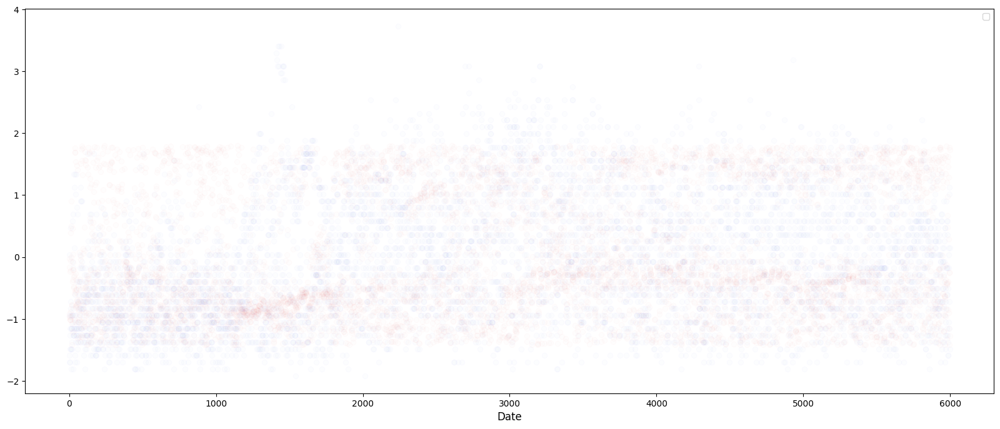

In [66]:
fig, axs = plt.subplots()
fig.set_size_inches(20,8)

plt.scatter(df.index, df[1], color='indianred', edgecolors='r', alpha = 0.01)
plt.scatter(df.index, df[2], color='royalblue', edgecolors='b', alpha = 0.01)
# plt.scatter(df.index, df[3], color='mediumseagreen', edgecolors='g')
plt.xlabel('Date',fontsize=12);
plt.legend()